<a href="https://colab.research.google.com/github/DJLee68/MachineLearningProject/blob/master/Assignment03/20154652DJLee_assignment_03_b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised Regression with Multiple Variables
<hr>

## 0. Import library
<ht>

In [113]:
# Import libraries

# math library
import numpy as np

# visualization library
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png2x','pdf')
import matplotlib.pyplot as plt

# machine learning library
from sklearn.linear_model import LinearRegression

# 3d visualization
from mpl_toolkits.mplot3d import axes3d

# computational time
import time

## 1. Load dataset
<hr>

Load a set of data points $\{ (x_i, y_i, z_i) \}_{i=1}^n$ where $x_i$ and $y_i$ are considered as an input and $z_i$ is considered as an output for $i$-th data point.

In [114]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)
print(f'Number of clean data = {n_clean}')
print(f'Number of noisy data = {n_noisy}')
print(f'Size of clean data = {data_clean.shape}')
print(f'Type of clean data = {data_clean.dtype}')
print(f'Size of noisy data = {data_noisy.shape}')
print(f'Type of noisy data = {data_noisy.dtype}')

Number of clean data = 3600
Number of noisy data = 3600
Size of clean data = (3600, 3)
Type of clean data = float64
Size of noisy data = (3600, 3)
Type of noisy data = float64


## 2. Explore the dataset distribution
<hr>

Plot the training data points in 3D cartesian coordinate system.
(You may use matplotlib function `scatter3D()`.)

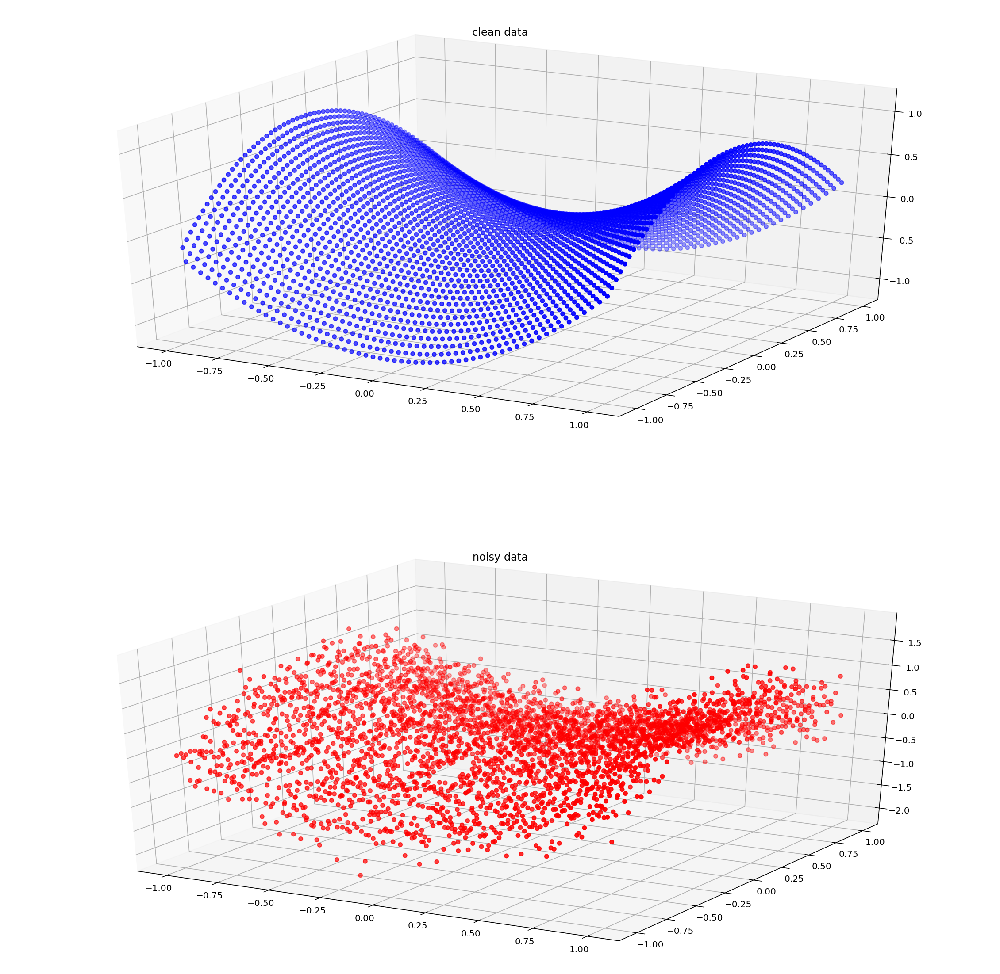

In [115]:
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]

x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(211, projection='3d')
ax2 = fig.add_subplot(212, projection='3d')

ax1.set_title('clean data')
ax1.scatter3D(x_clean, y_clean, z_clean, c='b')
ax2.set_title('noisy data')
ax2.scatter3D(x_train, y_train, z_train, c='r')

## 3. Define the prediction function 
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

where feature function $f$ is defined as follows:

$$
\begin{align*}
    f_0(x, y) &= \\
    f_1(x, y) &= \\
    f_2(x, y) &= \\
    f_3(x, y) &= \\
    f_4(x, y) &= \\
    f_5(x, y) &= \\
    f_6(x, y) &= \\
    f_7(x, y) &= \\
    f_8(x, y) &= \\
    f_9(x, y) &= 
\end{align*}
$$

### Vectorized implementation:

$$
f_w(x) = X w 
$$
with 
<br>
$$
X = 
\left[ 
\begin{array}{cccc}
f_0(x_1, y_1) & f_1(x_1, y_1) & f_2(x_1, y_1) & f_3(x_1, y_1) & f_4(x_1, y_1) & f_5(x_1, y_1) & f_6(x_1, y_1) & f_7(x_1, y_1) & f_8(x_1, y_1) & f_9(x_1, y_1) \\
f_0(x_2, y_2) & f_1(x_2, y_2) & f_2(x_2, y_2) & f_3(x_2, y_2) & f_4(x_2, y_2) & f_5(x_2, y_2) & f_6(x_2, y_2) & f_7(x_2, y_2) & f_8(x_2, y_2) & f_9(x_2, y_2) \\
\vdots\\
f_0(x_n, y_n) & f_1(x_n, y_n) & f_2(x_n, y_n) & f_3(x_n, y_n) & f_4(x_n, y_n) & f_5(x_n, y_n) & f_6(x_n, y_n) & f_7(x_n, y_n) & f_8(x_n, y_n) & f_9(x_n, y_n)
\end{array} 
\right]
\quad
\textrm{ and }
\quad
w = 
\left[ 
\begin{array}{cccc}
w_0 \\ 
w_1 \\
w_2 \\ 
w_3 \\ 
w_4 \\ 
w_5 \\
w_6 \\
w_7 \\
w_8 \\
w_9
\end{array} 
\right]
$$

Implement the vectorized version of the predictive function. <br>

In [116]:
# construct data matrix

n = data_noisy.shape[0]
X = np.ones([n,10]) 

X[:,0] = np.ones(n)
X[:,1] = x_train
X[:,2] = y_train
X[:,3] = np.multiply(x_train, y_train)
X[:,4] = np.square(x_train)
X[:,5] = np.square(y_train)
X[:,6] = np.power(x_train, 3)
X[:,7] = np.power(y_train, 3)
X[:,8] = np.multiply(np.square(x_train), np.square(y_train))
X[:,9] = np.multiply(np.power(x_train, 3), np.power(y_train, 3))
# parameters vector
w = np.array([1,1,1,1,1,1,1,1,1,1])[:,None] # [:,None] adds a singleton dimension
# predictive function definition
def f_pred(X,w): 
    
    f = np.dot(X,w)
    
    return f 

# Test predicitive function 
z_pred = f_pred(X,w)
print(z_pred.shape)
print(z_pred)

(3600, 1)
[[ 2.        ]
 [ 1.86669842]
 [ 1.73799368]
 ...
 [ 9.22255139]
 [ 9.60231576]
 [10.        ]]


## 4. Define the regression loss 
<hr>
$$
L(w)=\frac{1}{n} \sum_{i=1}^n \ \Big( f_w(x_i, y_i) – z_i \Big)^2
$$

### Vectorized implementation:

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$
with 
<br>
$$
Xw=
\left[ 
\begin{array}{cccc}
f_w(x_1, y_1) \\ 
f_w(x_2, y_2) \\ 
\vdots\\
f_w(x_n, y_n) \\ 
\end{array} 
\right]
\quad
\textrm{ and }
\quad
z = 
\left[ 
\begin{array}{cccc}
z_1 \\ 
z_2 \\ 
\vdots\\
z_n
\end{array} 
\right]
$$

Implement the vectorized version of the regression loss function. <br>


In [117]:
# loss function definition
def loss_mse(z_pred,z): 
    
    diff = z_pred - z.reshape(len(z), 1)
    loss = np.dot(diff.T, diff)/len(z)
    
    return loss


# Test loss function 
z = z_train# label
z_pred = f_pred(X,w)# prediction

loss = loss_mse(z_pred,z)

## 5. Define the gradient of the regression loss 
<hr>

$\bullet$ Vectorized implementation: Given the loss

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$

The gradient is given by  

$$
\frac{\partial}{\partial w} L(w) = \frac{2}{n} X^T(Xw-z)
$$


Implement the vectorized version of the gradient of the regression loss function.

In [118]:
# gradient function definition
def grad_loss(z_pred,z,X):

    diff = z_pred - z.reshape(len(z), 1)
    loss = np.dot(diff.T, diff)/len(z)
    grad = (np.dot(X.T, diff)*2) / len(z)
    
    return grad


# Test grad function 
z_pred = f_pred(X,w)
grad = grad_loss(z_pred,z,X)

## 6. Implement the gradient descent algorithm 
<hr>

### Vectorized implementation: 

$$
w^{k+1} = w^{k} - \tau  \frac{2}{n} X^T(Xw^{k}-z)
$$

Implement the vectorized version of the gradient descent function.

Plot the loss values $L(w^k)$ with respect to iteration $k$ the number of iterations.

Time= 0.34340834617614746
0.09029723998448039
[[ 0.01289059]
 [-0.03892453]
 [-0.05777757]
 [-0.16913159]
 [ 0.8922475 ]
 [-1.0239384 ]
 [ 0.18421056]
 [ 0.19525988]
 [ 0.23631591]
 [ 0.40373775]]


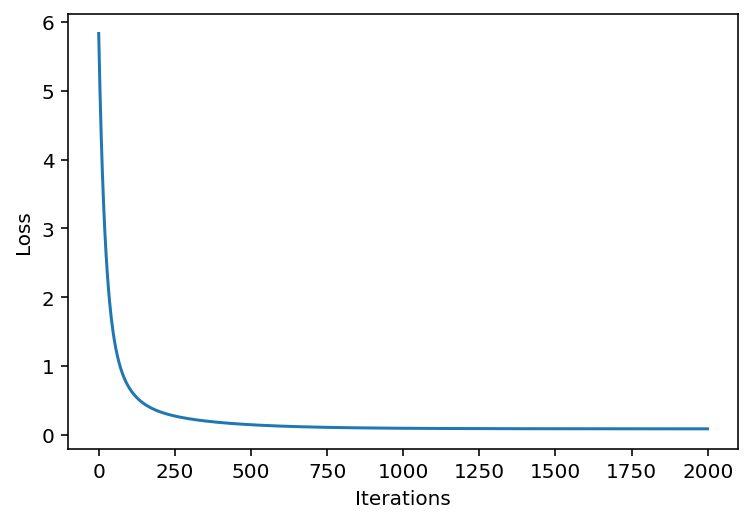

In [119]:
# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,10]) # record the loss values
    w = w_init # initialization
    for i in range(max_iter): # loop over the iterations
        
        z_pred = f_pred(X,w)# linear predicition function 
        grad_f = grad_loss(z_pred,z,X)# gradient of the loss 
        w = w - tau*grad_f# update rule of gradient descent
        L_iters[i] =  loss_mse(z_pred, z)# save the current loss value 
        w_iters[i,:] = w.reshape(1, len(w))# save the current w value 
        
    return w, L_iters, w_iters


# run gradient descent algorithm 
start = time.time()
w_init = w
tau = 0.01
max_iter = 2000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)

print('Time=',time.time() - start) # plot the computational cost
print(L_iters[-1]) # plot the last value of the loss
print(w_iters[-1].reshape(len(w_iters[-1]), 1)) # plot the last value of the parameter w 


# plot
plt.figure(2)
plt.plot(L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 7. Plot the prediction function
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

(You may use numpy function `meshgrid` and `plot_surface` for plot the linear prediction function.)

(60, 60)
(60, 60)
(60, 60)


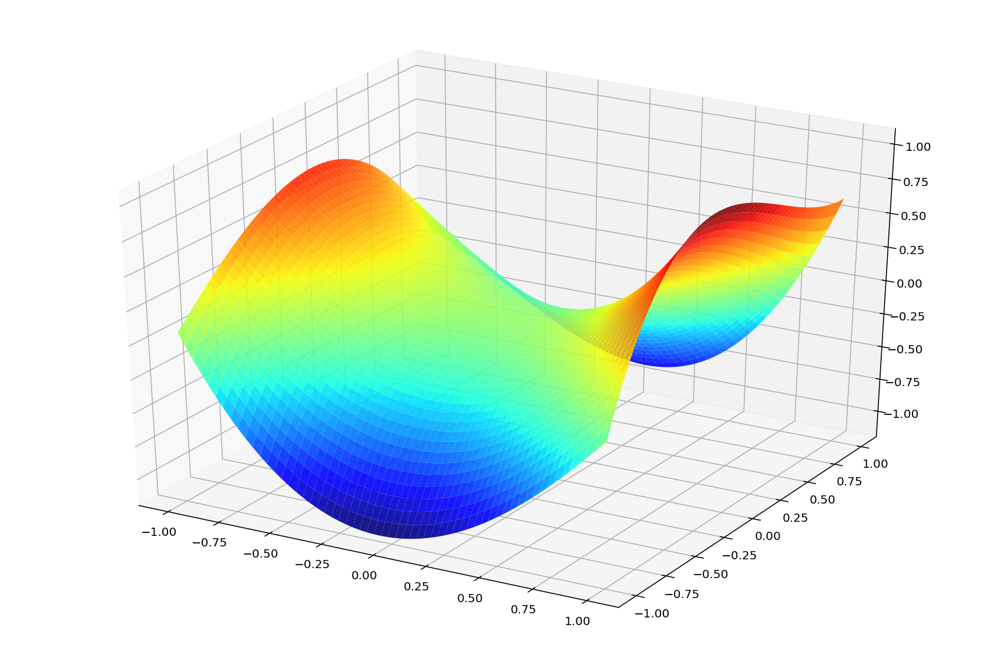

In [120]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = np.zeros((x_coordinate.size, y_coordinate.size))
print(x_pred.shape)
print(y_pred.shape)
print(z_pred.shape)

for (i,j), v in np.ndenumerate(z_pred): #{
    x_train = x_pred[i,j]
    y_train = y_pred[i,j]
    X = np.ones([1,10])
    X[:,0] = 1
    X[:,1] = x_train
    X[:,2] = y_train
    X[:,3] = np.multiply(x_train, y_train)
    X[:,4] = np.square(x_train)
    X[:,5] = np.square(y_train)
    X[:,6] = np.power(x_train, 3)
    X[:,7] = np.power(y_train, 3)
    X[:,8] = np.multiply(np.square(x_train), np.square(y_train))
    X[:,9] = np.multiply(np.power(x_train, 3), np.power(y_train, 3))

    z_pred[i,j] =  f_pred(X,w)
#}
# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.9, cmap=plt.cm.jet)

## 8. Plot the prediction function superimposed on the training data
<hr>

(-1.12, 1.12)

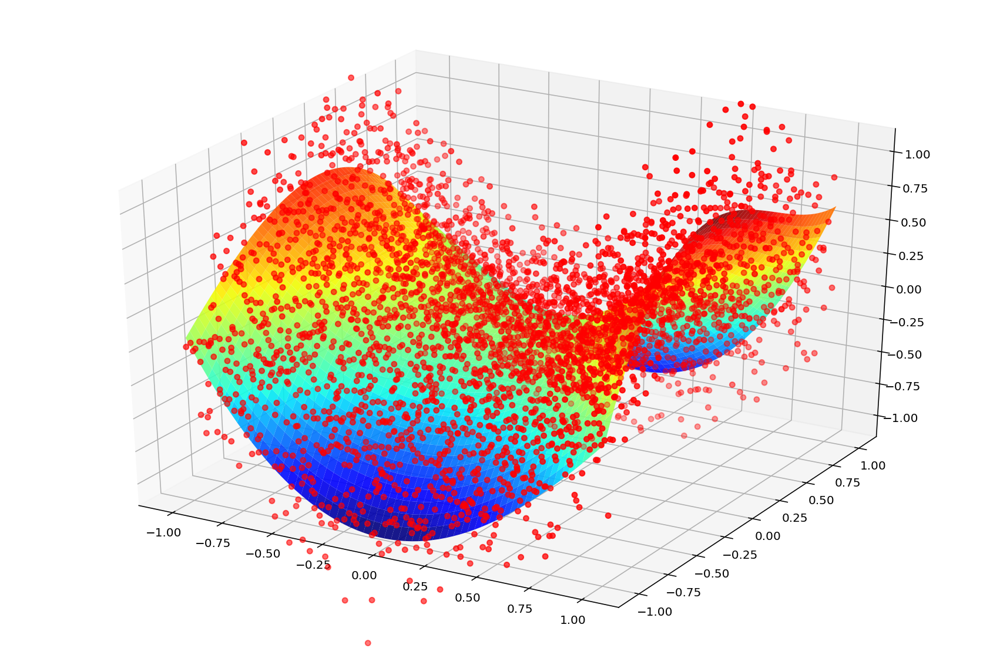

In [121]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = np.zeros((x_coordinate.size, y_coordinate.size))


for (i,j), v in np.ndenumerate(z_pred): #{
    x_train = x_pred[i,j]
    y_train = y_pred[i,j]
    X = np.ones([1,10])
    X[:,0] = 1
    X[:,1] = x_train
    X[:,2] = y_train
    X[:,3] = np.multiply(x_train, y_train)
    X[:,4] = np.square(x_train)
    X[:,5] = np.square(y_train)
    X[:,6] = np.power(x_train, 3)
    X[:,7] = np.power(y_train, 3)
    X[:,8] = np.multiply(np.square(x_train), np.square(y_train))
    X[:,9] = np.multiply(np.power(x_train, 3), np.power(y_train, 3))

    z_pred[i,j] =  f_pred(X,w)
#}

# plot

x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter3D(x_train, y_train, z_train, c='r')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.9, cmap=plt.cm.jet)
ax.set_xlim(-1.125,1.125)
ax.set_ylim(-1.125,1.125)
ax.set_zlim(-1.12,1.12)

# Output results

## 1. Plot the clean data in 3D cartesian coordinate system (1pt)

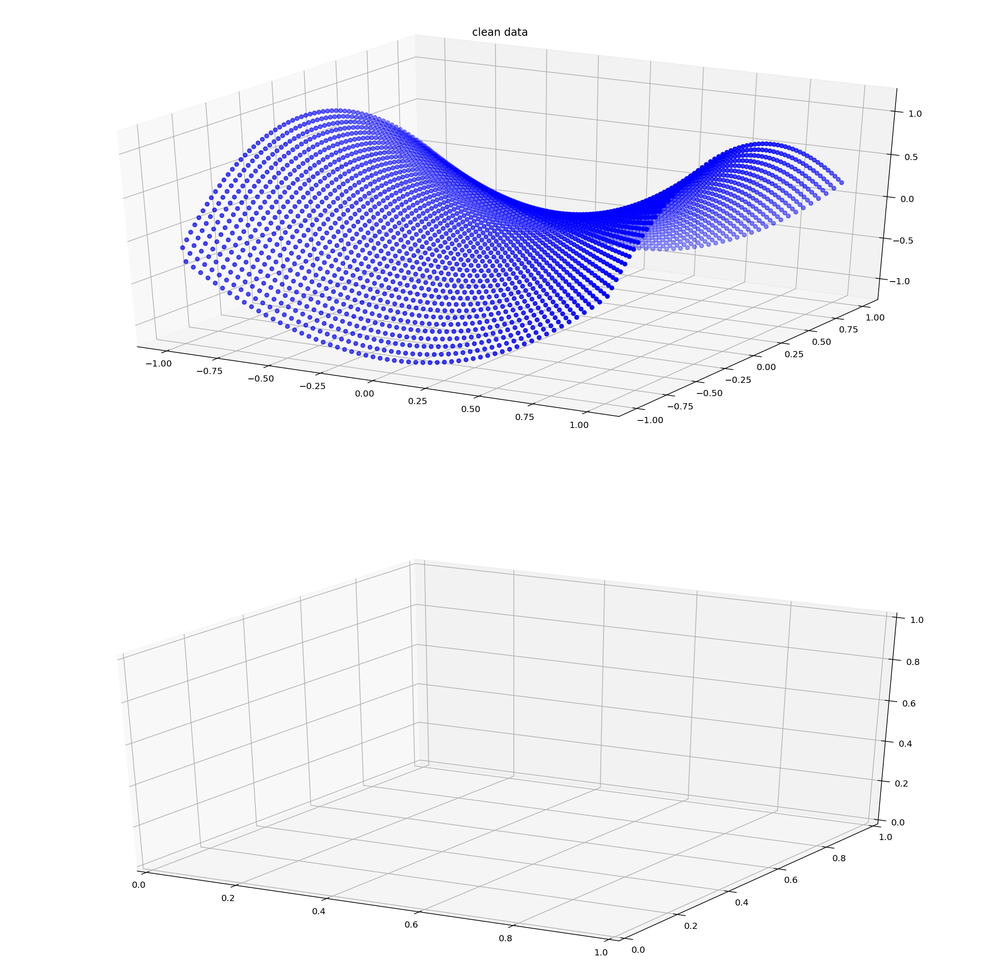

In [122]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(211, projection='3d')
ax2 = fig.add_subplot(212, projection='3d')

ax1.set_title('clean data')
ax1.scatter3D(x_clean, y_clean, z_clean, c='b')

## 2. Plot the noisy data in 3D cartesian coordinate system (1pt)

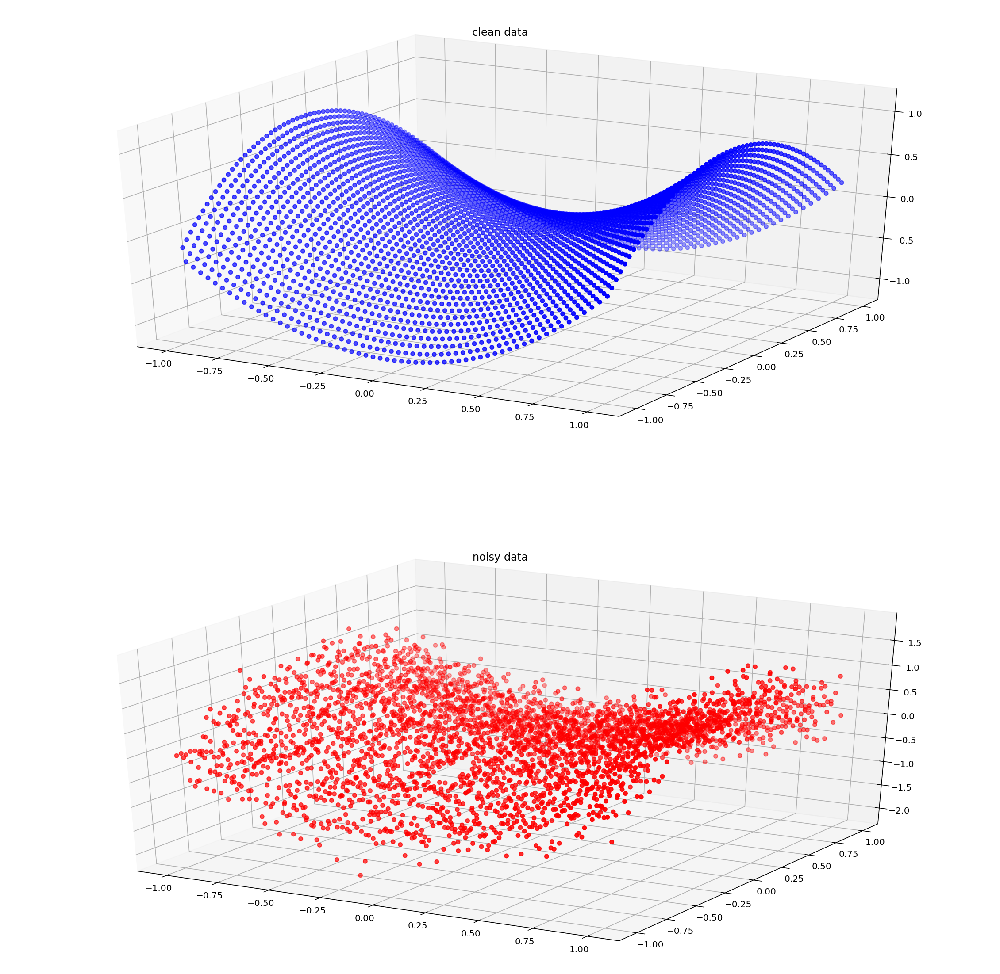

In [123]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(211, projection='3d')
ax2 = fig.add_subplot(212, projection='3d')

ax1.set_title('clean data')
ax1.scatter3D(x_clean, y_clean, z_clean, c='b')
ax2.set_title('noisy data')
ax2.scatter3D(x_train, y_train, z_train, c='r')

## 3. Plot the loss curve in the course of gradient descent (2pt)

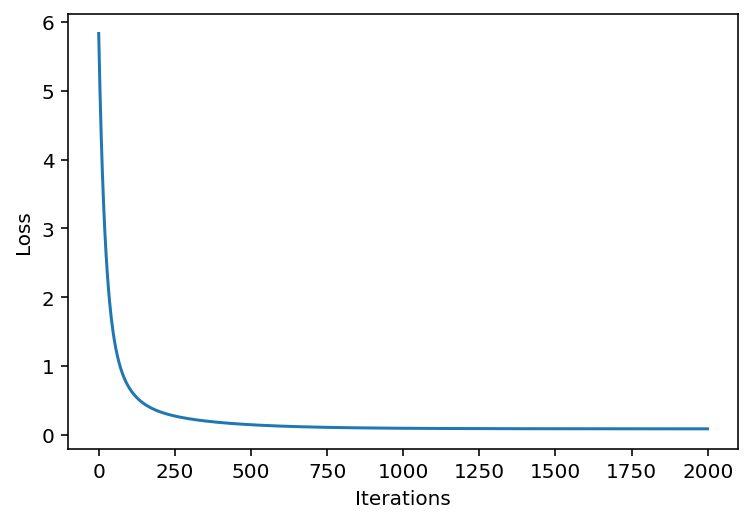

In [124]:
# plot
plt.figure(2)
plt.plot(L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 4. Print out the final loss value at convergence of the gradient descent (1pt)

In [125]:
print(f'loss at convergence = {L_iters[-1]}')

loss at convergence = 0.09029723998448039


## 5. Print out the final model parameter values at convergence of the gradient descent (1pt)

In [126]:
for i in range(10): #{
    print(f'model parameter: w_{i} = [{w_iters[-1,i]}]')    
#}

model parameter: w_0 = [0.01289058615494664]
model parameter: w_1 = [-0.03892452704022725]
model parameter: w_2 = [-0.05777756663689832]
model parameter: w_3 = [-0.16913159426491542]
model parameter: w_4 = [0.8922474972470745]
model parameter: w_5 = [-1.0239383956992574]
model parameter: w_6 = [0.18421055567410147]
model parameter: w_7 = [0.19525988474181458]
model parameter: w_8 = [0.23631590868858504]
model parameter: w_9 = [0.40373774718552985]


## 6. Plot the prediction function in 3D cartesian coordinate system (2pt)

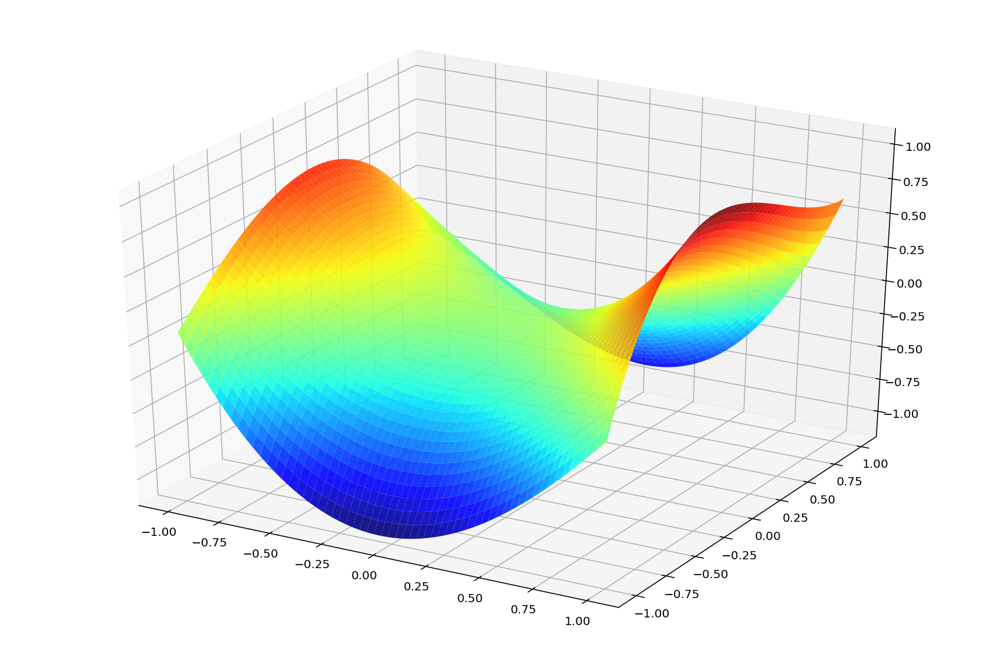

In [127]:
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.9, cmap=plt.cm.jet)

## 7. Plot the prediction functions superimposed on the training data (2pt)

(-1.12, 1.12)

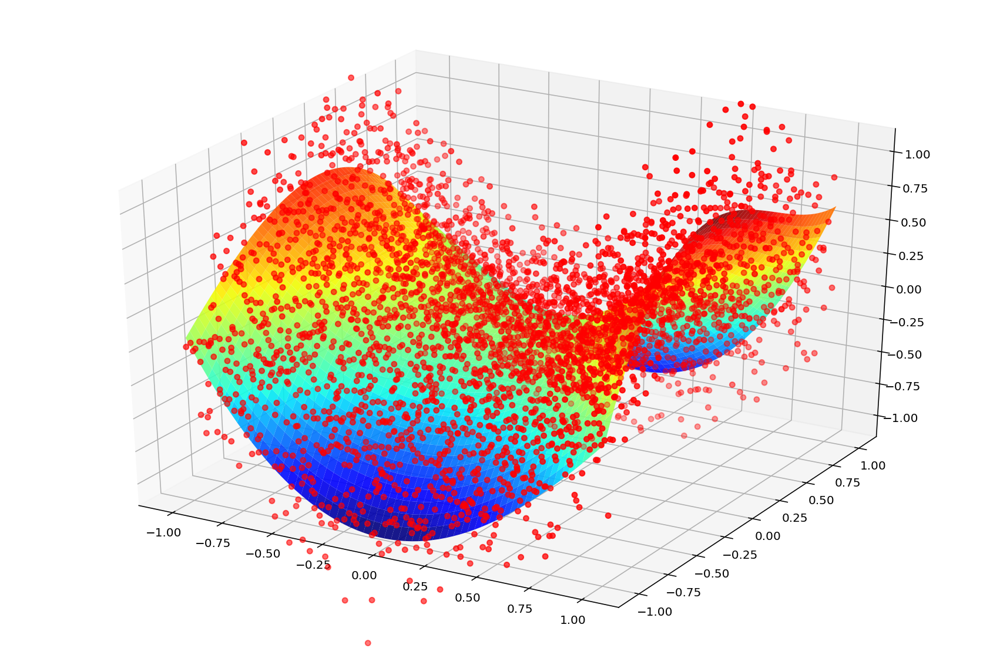

In [128]:
# plot

x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter3D(x_train, y_train, z_train, c='r')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.9, cmap=plt.cm.jet)
ax.set_xlim(-1.125,1.125)
ax.set_ylim(-1.125,1.125)
ax.set_zlim(-1.12,1.12)